In [4]:
import pandas as pd
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt

In [71]:
df = pd.read_excel('./data/Analyze data.xlsx')

In [72]:
df.columns

Index(['Unnamed: 0', 'cv ', 'prime_key', 'krisha_id', 'Unnamed: 3', 'price',
       'Unnamed: 5', 'description', 'is_mortgaged', 'seller', 'city',
       'date_creation', 'num_views', 'is_hot', 'is_paid_up', 'is_hyped_turbo',
       'is_cold_entry', 'num_pictures', 'num_rooms', 'Area', 'floor',
       'total_floors', 'year_builded', 'ceiling_height', 'Region', 'Address',
       'Unnamed: 25', 'Unnamed: 26', 'Unnamed: 27', 'Unnamed: 28'],
      dtype='object')

In [23]:
df.loc[df['floor'].isna(), 'floor'] = -1

In [24]:
df[df['total_floors'].isna()]['total_floors'] = -1

In [22]:
df.loc[df['total_floors'].isna(), 'total_floors'] = -1

In [70]:
df.to_excel('./data/Clear data.xlsx')

In [77]:
df.to_excel('./data/Analyze data.xlsx')

In [73]:
df['year_builded'].isna().any()

False

In [30]:
df.loc[df['year_builded'].isna(), 'year_builded'] = -1

In [32]:
df.head(10)

,cv,prime_key,krisha_id,Unnamed: 3,price,Unnamed: 5,description,is_mortgaged,seller,city,...,floor,total_floors,year_builded,ceiling_height,Region,Address,Unnamed: 25,Unnamed: 26,Unnamed: 27,Unnamed: 28
0,0,290,681821201,NaN,54500000,NaN,"кирпичный дом, 1992 г.п., состояние: хорошее, ...",False,Company,Алматы,...,1.0,5.0,1992.0,2.70,Auezov district,Мұстай Кәрім — Саина- Жандосова,NaN,NaN,NaN,NaN
1,1,800,681728446,NaN,19000000,NaN,"монолитный дом, 2001 г.п., состояние: хорошее,...",False,Company,Алматы,...,9.0,9.0,2001.0,2.60,Auezov district,мкр Аксай-1А,NaN,NaN,NaN,NaN
2,2,803,681601189,NaN,38500000,NaN,"панельный дом, 1990 г.п., состояние: среднее, ...",False,Company,Алматы,...,3.0,5.0,1990.0,2.80,Auezov district,мкр Аксай-3Б,NaN,NaN,NaN,NaN
3,3,804,682519850,NaN,32000000,NaN,"панельный дом, 1990 г.п., состояние: среднее, ...",False,Company,Алматы,...,2.0,5.0,1990.0,2.60,Auezov district,мкр Аксай-5,NaN,NaN,NaN,NaN
4,4,805,681600332,NaN,39500000,NaN,"панельный дом, 1991 г.п., состояние: хорошее, ...",False,Company,Алматы,...,1.0,9.0,1991.0,2.85,Auezov district,мкр Жетысу-2,NaN,NaN,NaN,NaN
5,5,807,680901348,NaN,66000000,NaN,"жил. комплекс Riviera, монолитный дом, 2022 г....",False,Company,Алматы,...,13.0,16.0,2022.0,3.00,Bostandyk district,Сатпаева 90/43а,NaN,NaN,NaN,NaN
6,6,824,682463161,NaN,35000000,NaN,"жил. комплекс Alatau City, монолитный дом, 201...",False,Company,Алматы,...,8.0,13.0,2018.0,2.75,Alatau district,Дарабоз 25,NaN,NaN,NaN,NaN
7,7,854,680594958,NaN,43000000,NaN,"жил. комплекс Алтын Булак, монолитный дом, 201...",False,Company,Алматы,...,5.0,19.0,2012.0,2.80,Almalinsky district,Брусиловского 159,NaN,NaN,NaN,NaN
8,8,1234,681274974,NaN,32400000,NaN,"панельный дом, 1977 г.п., состояние: среднее, ...",False,Company,Алматы,...,3.0,5.0,1977.0,2.70,Bostandyk district,мкр Казахфильм,NaN,NaN,NaN,NaN
9,9,1247,682569517,NaN,58000000,NaN,"жил. комплекс Amir, монолитный дом, 2022 г.п.,...",False,Company,Алматы,...,4.0,12.0,2022.0,3.00,Bostandyk district,Розыбакиева 320 — Ескараева,NaN,NaN,NaN,NaN


In [74]:
df['num_views'] = df['num_views'].apply(lambda x: int(x.replace('+','')) if isinstance(x, str) else x)

In [75]:
df['Area'] = df['Area'].apply(lambda x: float(x.replace(' m²', '')))

My turn 

In [39]:
df.columns

Index(['cv ', 'prime_key', 'krisha_id', 'Unnamed: 3', 'price', 'Unnamed: 5',
       'description', 'is_mortgaged', 'seller', 'city', 'date_creation',
       'num_views', 'is_hot', 'is_paid_up', 'is_hyped_turbo', 'is_cold_entry',
       'num_pictures', 'num_rooms', 'Area', 'floor', 'total_floors',
       'year_builded', 'ceiling_height', 'Region', 'Address', 'Unnamed: 25',
       'Unnamed: 26', 'Unnamed: 27', 'Unnamed: 28'],
      dtype='object')

In [67]:
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [62]:
import matplotlib.pyplot as plt
import graphviz 

In [76]:
x_train, x_test, y_train, y_test = train_test_split(df[['floor', 'ceiling_height', 'year_builded', 'num_views', 'Area']], df['price'])

In [38]:
dtree = tree.DecisionTreeRegressor()


In [51]:
dtree = dtree.fit(x_train, y_train)

In [52]:
dtree.score(x_test, y_test)

0.681346303608077

Not really good, lets use CV

In [55]:
valid_distr = []
for depth in range(2, 20):
    clf = tree.DecisionTreeRegressor(max_depth= depth)

    scores = cross_val_score(estimator= clf, X=df[['floor', 'ceiling_height', 'year_builded', 'num_views', 'Area']], y= df['price'], cv=10)
    valid_distr.append((depth, scores.mean()))


In [63]:
max(valid_distr, key=(lambda x: x[1]))

(10, 0.6268296156488338)

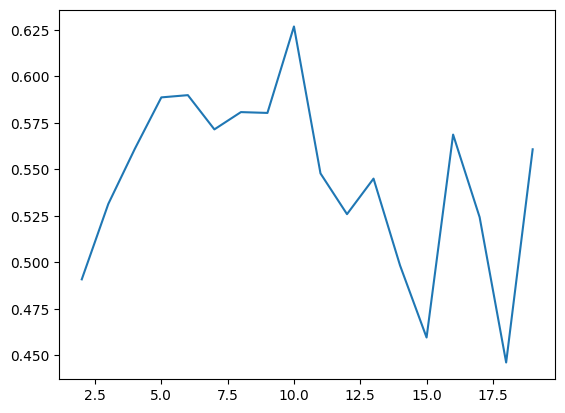

In [59]:
plt.plot(*zip(*valid_distr))
plt.show()

In [78]:
dtree = GridSearchCV(tree.DecisionTreeClassifier(), {'max_depth':range(2,20)})

In [79]:
dtree.fit(X=df[['floor', 'ceiling_height', 'year_builded', 'num_views', 'Area']], y= df['price'])

C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


GridSearchCV(estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': range(2, 20)})

In [86]:
tree_model = dtree.best_estimator_
print (dtree.best_score_, dtree.best_params_) 

0.14569324367595263 {'max_depth': 19}


In [87]:
dtree.score(x_test, y_test)

0.7543545081967213

In [138]:
dot_data = tree.export_graphviz(tree_model, out_file=None, filled=True)
graph = graphviz.Source(dot_data)

In [139]:
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files/Graphviz/bin/'

In [140]:
graph

Performance is not satisfying 

General Multi Linear Regression

In [106]:
from sklearn.linear_model import LinearRegression

In [105]:
df.columns

Index(['Unnamed: 0', 'cv ', 'prime_key', 'krisha_id', 'Unnamed: 3', 'price',
       'Unnamed: 5', 'description', 'is_mortgaged', 'seller', 'city',
       'date_creation', 'num_views', 'is_hot', 'is_paid_up', 'is_hyped_turbo',
       'is_cold_entry', 'num_pictures', 'num_rooms', 'Area', 'floor',
       'total_floors', 'year_builded', 'ceiling_height', 'Region', 'Address',
       'Unnamed: 25', 'Unnamed: 26', 'Unnamed: 27', 'Unnamed: 28'],
      dtype='object')

In [107]:
lm = LinearRegression().fit(X=df[['floor', 'ceiling_height', 'year_builded', 'num_views', 'Area']], y= df['price'])

In [108]:
lm.score(X=df[['floor', 'ceiling_height', 'year_builded', 'num_views', 'Area']], y= df['price'])

0.6293093139362163

In [109]:
lm.coef_

array([ 2.26247514e+05,  1.62895472e+06,  5.24645834e+03, -8.90131003e+01,
        1.00188246e+06])

In [110]:
lm.intercept_

-32497700.969851457

In [111]:
df['price_per_m2'] = df['price']/df['Area']

In [124]:
lm = LinearRegression().fit(X=df[['floor_percent', 'ceiling_height', 'year_builded', 'num_views', 'num_rooms', 'total_floors']], y= df['price_per_m2'])

In [123]:
df['floor_percent'] = df['floor']/df['total_floors'] * 100

In [125]:
lm.score(X=df[['floor_percent', 'ceiling_height', 'year_builded', 'num_views', 'num_rooms', 'total_floors']], y= df['price_per_m2'])

0.0698793780788104

In [126]:
lm.coef_

array([-1.72147700e+02,  2.06631551e+04, -1.99161052e+02, -3.13708939e+00,
        3.83917125e+04,  1.00814434e+04])

In [127]:
lm.intercept_

899919.2567752448

ACcuracy is lame

Regions will be added

In [128]:
from sklearn.preprocessing import OneHotEncoder

In [131]:
df_onehot = pd.get_dummies(df['Region'])

# concatenate the original dataframe with the one hot encoded dataframe
df_final = pd.concat([df, df_onehot], axis=1)

In [135]:
lm = LinearRegression().fit(X=df_final[['floor_percent', 'ceiling_height', 'year_builded', 'num_views', 'num_rooms', 'total_floors','Alatau district', 'Almalinsky district', 'Auezov district', 'Bostandyk district', 'Medeu district', 'Nauryzbay district','Turksib district', 'Zhetysu district', 'Торекулова' ]], y= df_final['price_per_m2'])

In [134]:
df_onehot.columns

Index(['Alatau district', 'Almalinsky district', 'Auezov district',
       'Bostandyk district', 'Medeu district', 'Nauryzbay district',
       'Turksib district', 'Zhetysu district', 'Торекулова'],
      dtype='object')

In [136]:
lm.fit(X=df_final[['floor_percent', 'ceiling_height', 'year_builded', 'num_views', 'num_rooms', 'total_floors','Alatau district', 'Almalinsky district', 'Auezov district', 'Bostandyk district', 'Medeu district', 'Nauryzbay district','Turksib district', 'Zhetysu district', 'Торекулова' ]], y= df_final['price_per_m2'])

LinearRegression()

In [137]:
lm.score(X=df_final[['floor_percent', 'ceiling_height', 'year_builded', 'num_views', 'num_rooms', 'total_floors','Alatau district', 'Almalinsky district', 'Auezov district', 'Bostandyk district', 'Medeu district', 'Nauryzbay district','Turksib district', 'Zhetysu district', 'Торекулова' ]], y= df_final['price_per_m2'])

0.2933346555506966

Linear model is lame go to Random Forest

In [141]:
from sklearn.ensemble import RandomForestRegressor

In [163]:
forest = RandomForestRegressor(max_depth=4, random_state=0, n_estimators=2000)

In [164]:
forest.fit(X=df_final[['floor_percent', 'ceiling_height', 'year_builded', 'num_views', 'num_rooms', 'total_floors']], y= df_final['price_per_m2'])

RandomForestRegressor(max_depth=4, n_estimators=2000, random_state=0)

In [166]:
forest.score(X=df_final[['floor_percent', 'ceiling_height', 'year_builded', 'num_views', 'num_rooms', 'total_floors']], y= df_final['price_per_m2'])

0.3011603715887734

In [168]:
dtree.fit(X=df_final[['floor_percent', 'ceiling_height', 'year_builded', 'num_views', 'num_rooms', 'total_floors','Alatau district', 'Almalinsky district', 'Auezov district', 'Bostandyk district', 'Medeu district', 'Nauryzbay district','Turksib district', 'Zhetysu district', 'Торекулова' ]], y= df['price']//df['Area'])

C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\model_selection\_split.py:700: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


GridSearchCV(estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': range(2, 20)})

In [167]:
dtree.score(X=df_final[['floor_percent', 'ceiling_height', 'year_builded', 'num_views', 'num_rooms', 'total_floors','Alatau district', 'Almalinsky district', 'Auezov district', 'Bostandyk district', 'Medeu district', 'Nauryzbay district','Turksib district', 'Zhetysu district', 'Торекулова' ]], y= df_final['price_per_m2'])

ValueError: The feature names should match those that were passed during fit.
Feature names unseen at fit time:
- Alatau district
- Almalinsky district
- Auezov district
- Bostandyk district
- Medeu district
- ...
Feature names seen at fit time, yet now missing:
- floor


In [2]:
df = pd.read_excel('../data/init_dataset_almaty2023_2_1.xlsx')

In [12]:
df.columns

Index(['Unnamed: 0', 'id', 'title', 'price', 'location', 'description',
       'is_mortgaged', 'seller', 'city', 'date_creation', 'num_views',
       'is_hot', 'is_paid_up', 'is_hyped_turbo', 'is_cold_entry',
       'num_pictures'],
      dtype='object')

In [17]:
df['num_rooms'] = pd.to_numeric(df.title.apply(lambda x: x[:x.find('-')]))

In [25]:
df['area'] = pd.to_numeric(df.title.apply(lambda x: x.split(',')[1]).str.replace('м²',''))

In [78]:
def get_floor(title, is_total=False):
    splitted = title.split(',')
    if len(splitted) == 3:
            floor_text = splitted[-1].replace('этаж','')
            if '/' not in floor_text and is_total:
                return -1
            
            return int(floor_text.split('/')[is_total])
    else:
        return -1

In [82]:
df['floor'] =  df.title.apply(lambda x: get_floor(x))

In [88]:
df['total_floor'] = df.title.apply(lambda x: get_floor(x, True))

In [97]:
df['is_cold_entry'] = df['seller'] == 'Новостройка'

In [109]:
def get_year_built(text):
    text = text.replace('г.п','г.п.')
    year_index = text.find('г.п.')
    starter = text[:year_index].rfind(',')
    return int(text[starter + 1:year_index])


In [113]:
df['year_built'] = df.description.apply(lambda x: get_year_built(x))

In [119]:
df.drop(columns=['Unnamed: 0','title']).rename(columns={'id':'krisha_id'}).to_excel('../data/data2023_may.xlsx')

In [5]:
df = pd.read_excel('../data/data2023_may.xlsx')

<AxesSubplot: xlabel='num_views'>

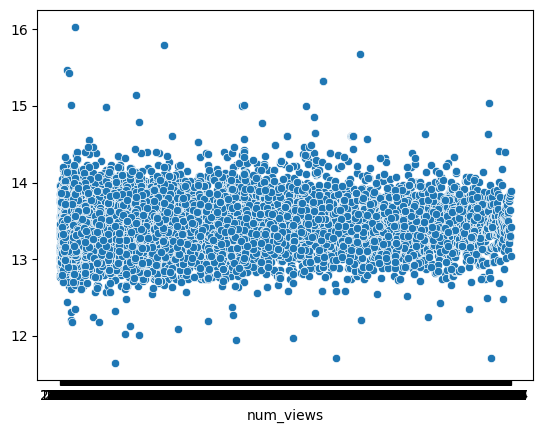

In [8]:
sns.scatterplot(x=df['num_views'],y=np.log(df['price']/df['area']))

In [9]:
df.columns

Index(['Unnamed: 0', 'Unnamed: 0_x', 'id', 'title', 'price', 'location',
       'description', 'is_mortgaged', 'seller', 'city_x', 'date_creation',
       'num_views', 'is_hot', 'is_paid_up', 'is_hyped_turbo', 'is_cold_entry',
       'num_pictures', 'num_rooms', 'area', 'floor', 'total_floor',
       'year_built', 'Unnamed: 0_y', 'city_y', 'address', 'Full Address',
       'Latitude', 'Longitude'],
      dtype='object')

In [13]:
df = df.drop(columns=['Unnamed: 0', 'Unnamed: 0_x','Unnamed: 0_y', 'city_y', 'address', 'Full Address',
       'Latitude', 'Longitude', 'title']).rename(columns={'id':'krisha_id','city_x':'city'})

In [18]:
def get_full_address(row):
    if 'Алматы' in row['location']:
        return row['location']
    else:
        return row['city'] + ', ' + row['location']

In [20]:
df['full_address'] = df.apply(lambda x: get_full_address(x),axis=1)

In [21]:
df.to_excel('../data/data2023_may.xlsx')